In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from collections import defaultdict
from scipy.stats import linregress

df = pd.read_csv('metadata/image_collection_clean.csv')

DATA_PATH = "data" 

def read_fits(file):
    with fits.open(file) as hdul:
        data = hdul[0].data.astype(float)
        header = hdul[0].header
    return data, header


bias_im = {}

for night in [f for f in os.listdir("data") if f.startswith("202")]:
    files = [f for f in os.listdir(f"data/{night}/") if ".fit" in f]
    for file in files:
        if file.endswith(".fits") or file.endswith(".fit"):
            path = os.path.join(DATA_PATH, night, file)

            data, header = read_fits(path)
            diffs = []
            for i in range(0, len(data)-1, 2):
                diffs.append(data[i] - data[i+1])
    
            if header["IMAGETYP"] == "zero":
                bias_im[header["CAMTEM"]]=data





/tmp/ipykernel_1386429/1381537450.py:10: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('metadata/image_collection_clean.csv')


In [2]:
diffs_temps = {}
for t in bias_im.keys():
    rn = []
    values = bias_im[t]
    for i in range(0, len(values)-1, 2):
        rn.append(np.std(values[i] - values[i+1])/np.sqrt(2))
    diffs_temps[t]=np.mean(rn)
sorted(diffs_temps)

[-50.0, -49.0, -42.0, -35.0, -34.0, -26.0, -23.0, -20.0, -17.0, -15.0, -5.0]

/tmp/ipykernel_1386429/1434406605.py:1: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


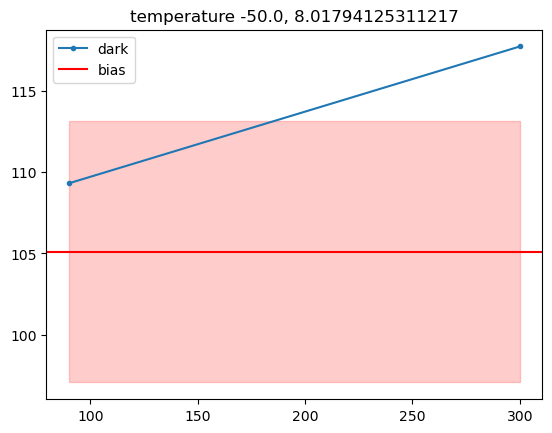

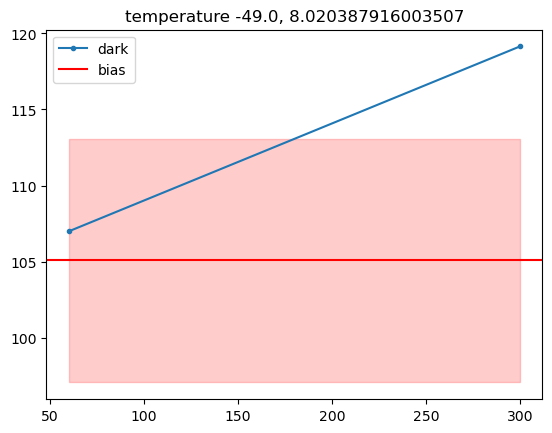

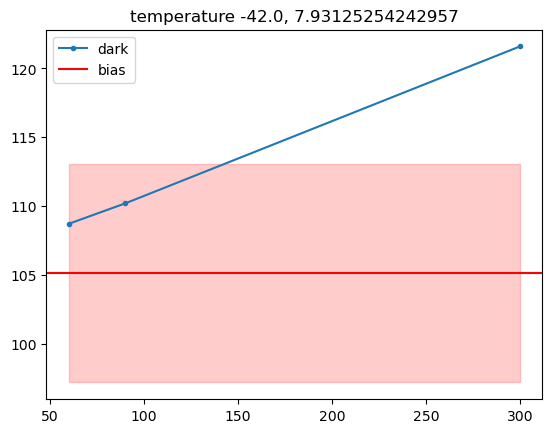

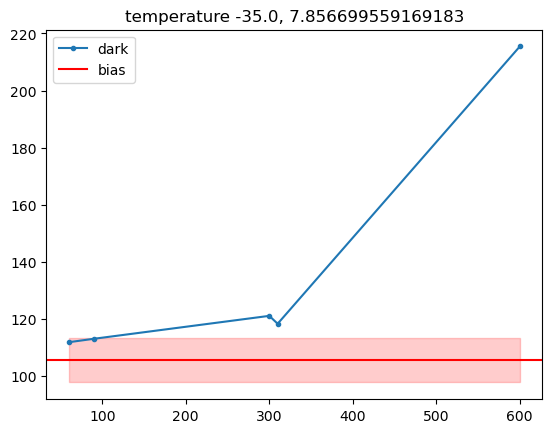

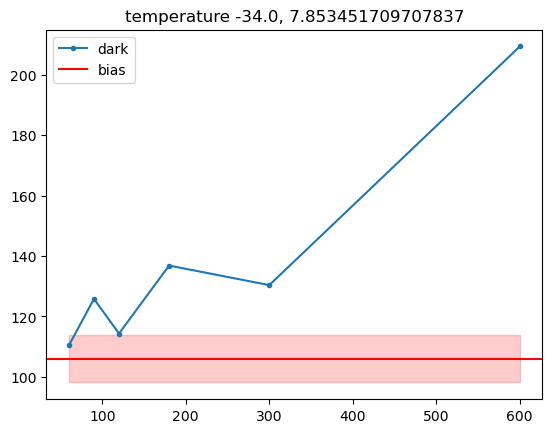

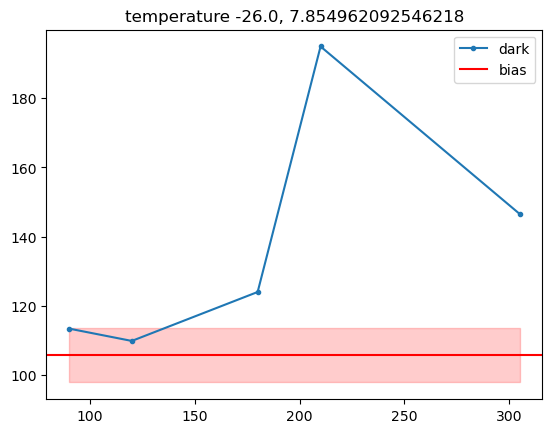

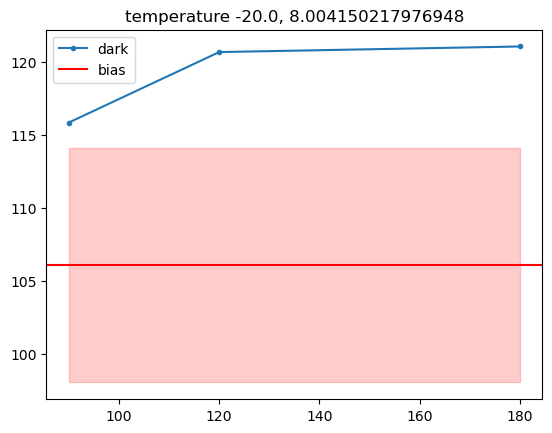

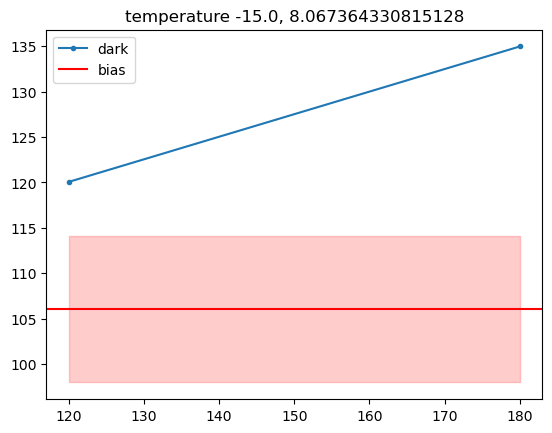

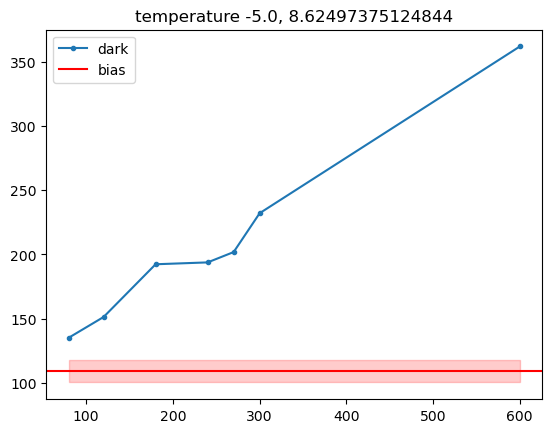

In [3]:
df = pd.read_csv("metadata/image_collection_clean.csv")

for T in sorted(diffs_temps):
    df_temp = df[(np.abs(df["camtem"] - T) < 0.5) & (df["imagetyp"]=="dark")]
    if len(df_temp) < 10:
        continue
    dark_means = df_temp.groupby("exptime")["counts_mean"].mean()
    df_temp = df[(np.abs(df["camtem"] - T) < 0.5) & (df["imagetyp"]=="zero")]
    if len(df_temp) < 10:
        continue
    bias_mean = df_temp["counts_mean"].mean()
    RN =diffs_temps[T]
    plt.figure()
    plt.title(f"temperature {T}, {RN}")
    plt.plot(dark_means.keys(), dark_means.values, ".-", label="dark")
    plt.axhline(bias_mean, color="r", label="bias")
    plt.fill_between(
                    [min(dark_means.index), max(dark_means.index)],
                    bias_mean - RN,
                    bias_mean + RN,
                    color="r",
                    alpha=0.2
                )
    plt.legend()


/tmp/ipykernel_1386429/1301881357.py:1: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


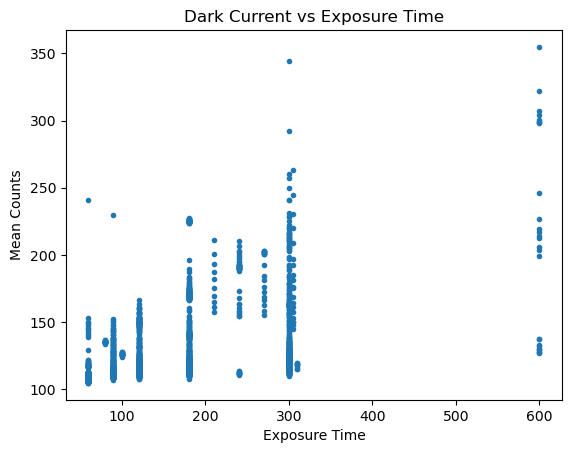

/tmp/ipykernel_1386429/1301881357.py:15: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


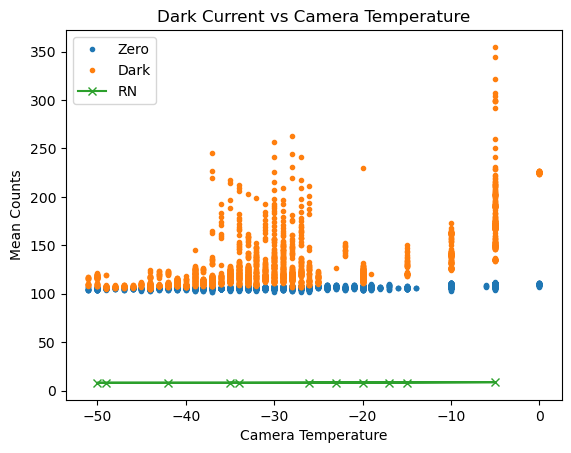

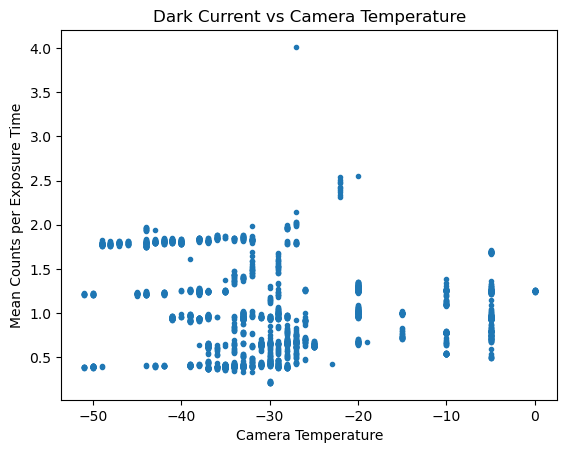

In [24]:
df = pd.read_csv("metadata/image_collection_clean.csv")
dark_df = df[df["imagetyp"] == "dark"]

mean = dark_df["counts_mean"].mean()
std = dark_df["counts_mean"].std()

dark_df_clean = dark_df[(dark_df["counts_mean"] > mean - 3*std) & 
                        (dark_df["counts_mean"] < mean + 3*std)]
import matplotlib.pyplot as plt
plt.plot(dark_df_clean["exptime"], dark_df_clean["counts_mean"], ".")
plt.xlabel("Exposure Time")
plt.ylabel("Mean Counts")
plt.title("Dark Current vs Exposure Time")
plt.show()
df = pd.read_csv("metadata/image_collection_clean.csv")
zero_df = df[df["imagetyp"] == "zero"]

mean = zero_df["counts_mean"].mean()
std = zero_df["counts_mean"].std()

zero_df_clean = zero_df[(zero_df["counts_mean"] > mean - 3*std) & 
                        (zero_df["counts_mean"] < mean + 3*std)]
import matplotlib.pyplot as plt

plt.plot(zero_df_clean["camtem"], zero_df_clean["counts_mean"], ".", label="Zero")
plt.plot(dark_df_clean["camtem"], dark_df_clean["counts_mean"], ".", label="Dark")
plt.plot(diffs_temps.keys(), diffs_temps.values(), "x-", label="RN")
plt.xlabel("Camera Temperature")
plt.ylabel("Mean Counts")
plt.title("Dark Current vs Camera Temperature")
plt.legend()
plt.show()
dark_rate = dark_df_clean["counts_mean"] / dark_df_clean["exptime"]
plt.plot(dark_df_clean["camtem"], dark_rate, ".")
plt.xlabel("Camera Temperature")
plt.ylabel("Mean Counts per Exposure Time")
plt.title("Dark Current vs Camera Temperature")
plt.show()


/tmp/ipykernel_1386429/1371920924.py:1: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


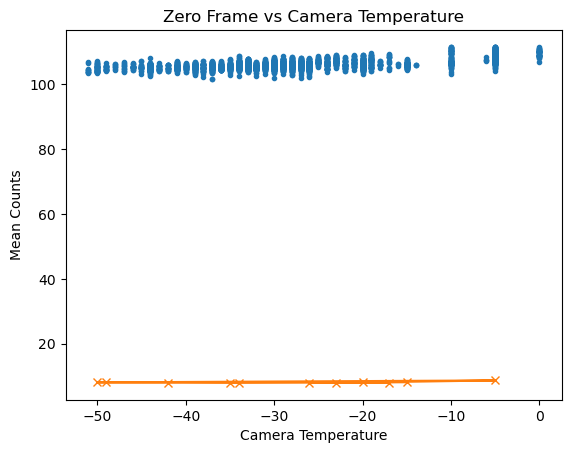

In [21]:
df = pd.read_csv("metadata/image_collection_clean.csv")
zero_df = df[df["imagetyp"] == "zero"]

mean = zero_df["counts_mean"].mean()
std = zero_df["counts_mean"].std()

zero_df_clean = zero_df[(zero_df["counts_mean"] > mean - 3*std) & 
                        (zero_df["counts_mean"] < mean + 3*std)]
import matplotlib.pyplot as plt

plt.plot(zero_df_clean["camtem"], zero_df_clean["counts_mean"], ".")
plt.plot(diffs_temps.keys(), diffs_temps.values(), "x-", label="RN")
plt.xlabel("Camera Temperature")
plt.ylabel("Mean Counts")
plt.title("Zero Frame vs Camera Temperature")
plt.show()



/tmp/ipykernel_1386429/1067433424.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dark_df_clean["dark_rate"] = dark_df_clean["counts_mean"] / dark_df_clean["exptime"]


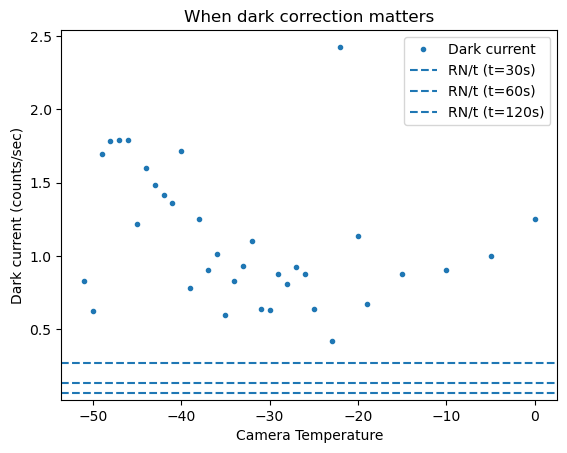

In [ ]:
rn_mean = np.mean(list(diffs_temps.values()))  # read noise típico

# Dark rate
dark_df_clean["dark_rate"] = dark_df_clean["counts_mean"] / dark_df_clean["exptime"]

# Agrupar por temperatura (promedio para limpiar ruido)
grouped = dark_df_clean.groupby("camtem")["dark_rate"].mean()

temps = grouped.index
rates = grouped.values

plt.plot(temps, rates, ".", label="Dark current")

# Líneas de referencia para distintos tiempos de exposición
for t in [30, 60, 120]:  # segundos
    plt.axhline( , linestyle="--", label=f"RN/t (t={t}s)")

plt.xlabel("Camera Temperature")
plt.ylabel("Dark current (counts/sec)")
plt.title("When dark correction matters")
plt.legend()
plt.show()

dark[counts]=bias+dark+RN

bias[counts]=bias+RN

⇒dark signal=dark[counts]−bias[counts]

dark current = dark signal / t

criterio:dark signal∼RN

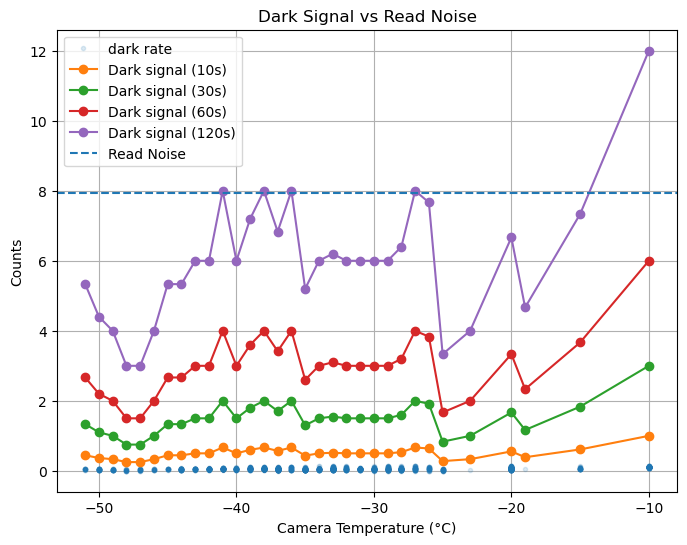

In [40]:
# =========================
# Elegir tiempos de exposición representativos
# =========================
times = [10, 30, 60, 120]  # segundos

plt.figure(figsize=(8,6))

# datos crudos (opcional, baja opacidad)
plt.plot(dark_df["camtem"], dark_df["dark_rate"], ".", alpha=0.15, label="dark rate")

# curva robusta (mediana ya calculada)
for t in times:
    dark_signal = rates * t
    plt.plot(temps, dark_signal, "o-", label=f"Dark signal ({t}s)")

# línea de read noise
plt.axhline(rn_mean, linestyle="--", label="Read Noise")

plt.xlabel("Camera Temperature (°C)")
plt.ylabel("Counts")
plt.title("Dark Signal vs Read Noise")
plt.legend()
plt.grid(True)

plt.show()

/tmp/ipykernel_1386429/2900262662.py:6: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


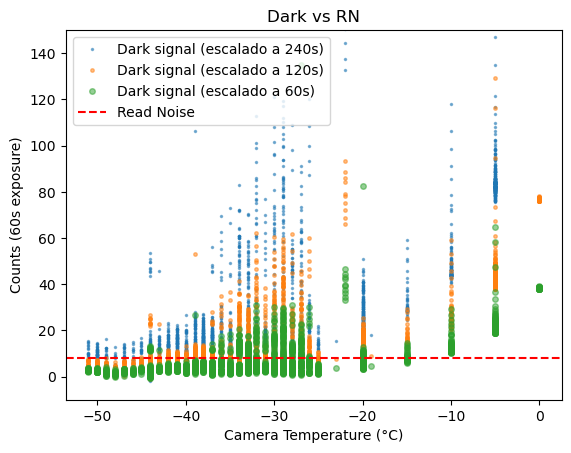

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


df = pd.read_csv("metadata/image_collection_clean.csv")
df=df[df["check_status"].str.startswith("OK")]

dark = df[df["imagetyp"] == "dark"].copy()
bias = df[df["imagetyp"] == "zero"].copy()


bias_model = bias.groupby("camtem")["counts_mean"].median()


dark["bias"] = np.interp(dark["camtem"],
                         bias_model.index,
                         bias_model.values)


dark["dark_signal"] = dark["counts_mean"] - dark["bias"]
darl = dark [dark["dark_signal"]>0]


rn = np.median(list(diffs_temps.values()))

for t, ms  in zip([240, 120, 60], [3,5,8]):
    dark["dark_scaled"] = dark["dark_signal"] * (t / dark["exptime"])
    plt.plot(dark["camtem"], dark["dark_scaled"], ".", ms=ms,label=f"Dark signal (escalado a {t}s)", alpha=0.5)
plt.axhline(rn, linestyle="--", color="r", label="Read Noise")

plt.xlabel("Camera Temperature (°C)")
plt.ylabel(f"Counts ({t}s exposure)")
plt.title("Dark vs RN")
plt.ylim(-10, 150)
plt.legend()
plt.show()

/tmp/ipykernel_1386429/3781531167.py:9: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


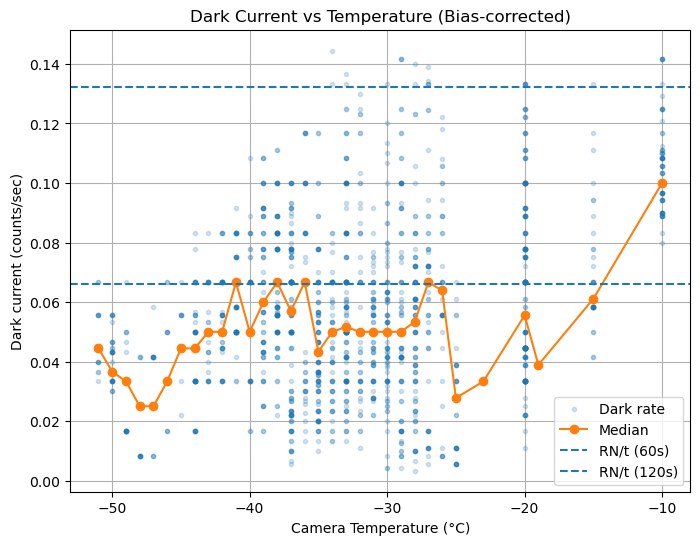

Example decision: False


In [65]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================
# 1. Cargar datos
# =========================
df = pd.read_csv("metadata/image_collection_clean.csv")

dark_df = df[df["imagetyp"] == "dark"].copy()
zero_df = df[df["imagetyp"] == "zero"].copy()

# =========================
# 2. Limpieza robusta (IQR)
# =========================
def clean_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    return df[(df[col] > Q1 - 1.5*IQR) & (df[col] < Q3 + 1.5*IQR)]

for col in ["counts_median", "camtem"]:
    dark_df = clean_iqr(dark_df, col)
    zero_df = clean_iqr(zero_df, col)

# =========================
# 3. Modelo de bias (mediana por temperatura)
# =========================
bias_model = zero_df.groupby("camtem")["counts_median"].median()

# Interpolación continua
def bias_interp(temp):
    return np.interp(temp, bias_model.index, bias_model.values)

# =========================
# 4. Restar bias → dark real
# =========================
dark_df["bias"] = bias_interp(dark_df["camtem"])
dark_df["dark_only"] = dark_df["counts_median"] - dark_df["bias"]

# eliminar valores negativos (ruido)
dark_df = dark_df[dark_df["dark_only"] > 0]

# =========================
# 5. Dark current (cuentas/seg)
# =========================
dark_df["dark_rate"] = dark_df["dark_only"] / dark_df["exptime"]

# limpieza adicional en dark_rate
dark_df = clean_iqr(dark_df, "dark_rate")

# =========================
# 6. Agrupación robusta (mediana)
# =========================
grouped = dark_df.groupby("camtem")["dark_rate"].median()

temps = grouped.index.values
rates = grouped.values

# =========================
# 7. Read Noise (ya calculado)
# =========================
# usar tu diccionario diffs_temps
rn_values = np.array(list(diffs_temps.values()))
rn_mean = np.median(rn_values)

# =========================
# 8. Plot científico clave
# =========================
plt.figure(figsize=(8,6))

# datos crudos (transparentes)
plt.plot(dark_df["camtem"], dark_df["dark_rate"], ".", alpha=0.2, label="Dark rate")

# tendencia robusta
plt.plot(temps, rates, "o-", label="Median")

# líneas de decisión para distintos tiempos
for t in [60, 120]:
    plt.axhline(rn_mean / t, linestyle="--", label=f"RN/t ({t}s)")

plt.xlabel("Camera Temperature (°C)")
plt.ylabel("Dark current (counts/sec)")
plt.title("Dark Current vs Temperature (Bias-corrected)")
plt.legend()
plt.grid(True)

plt.show()

# =========================
# 9. Función de decisión
# =========================
def needs_dark_correction(temp, exptime):
    dark_rate = np.interp(temp, temps, rates)
    return (dark_rate * exptime) > rn_mean

# ejemplo
print("Example decision:", needs_dark_correction(-20, 60))

/tmp/ipykernel_1386429/2285136333.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dark_df_clean["dark_signal_60s"] = dark_df_clean["dark_rate"] * 60


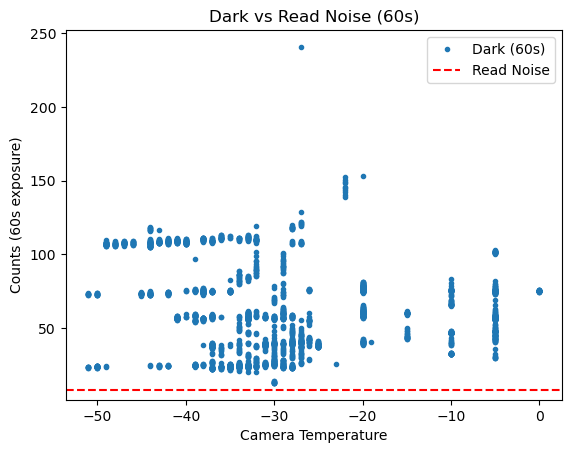

In [13]:
dark_df_clean["dark_signal_60s"] = dark_df_clean["dark_rate"] * 60

plt.plot(dark_df_clean["camtem"], dark_df_clean["dark_signal_60s"], ".", label="Dark (60s)")
plt.axhline(rn_mean, color="red", linestyle="--", label="Read Noise")

plt.xlabel("Camera Temperature")
plt.ylabel("Counts (60s exposure)")
plt.title("Dark vs Read Noise (60s)")
plt.legend()
plt.show()

/tmp/ipykernel_1689437/4253387800.py:5: DtypeWarning: Columns (8,14,28,30,43,60,63,64,69,85,100,104) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("metadata/image_collection_clean.csv")


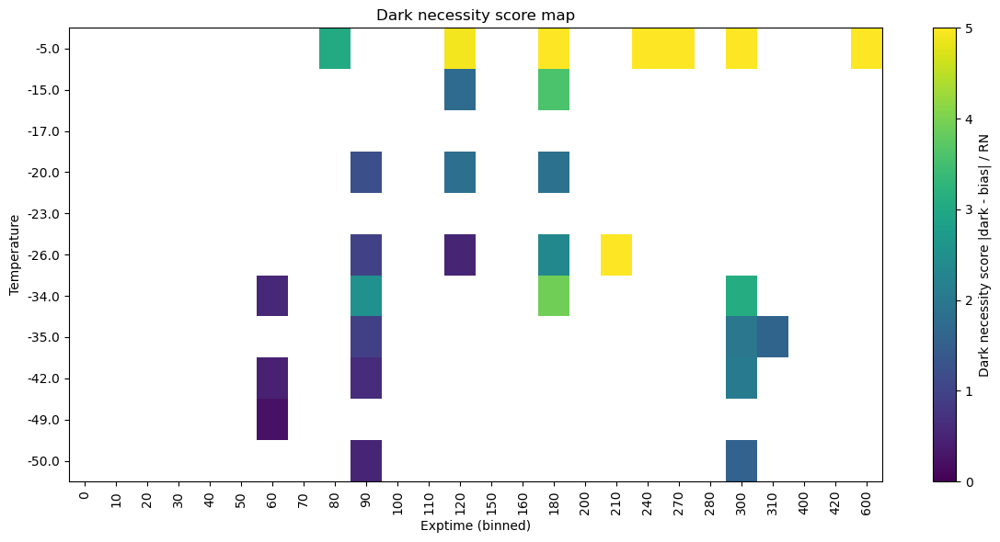

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("metadata/image_collection_clean.csv")

temps = sorted(diffs_temps.keys())

# binning de exptime (ajustable)
exptime_bins = np.unique(np.round(df["exptime"] / 10) * 10)

score_map = np.full((len(temps), len(exptime_bins)), np.nan)

for i, T in enumerate(temps):

    df_T_dark = df[(np.abs(df["camtem"] - T) < 0.5) & (df["imagetyp"] == "dark")]
    df_T_bias = df[(np.abs(df["camtem"] - T) < 0.5) & (df["imagetyp"] == "zero")]

    if len(df_T_dark) < 10 or len(df_T_bias) < 10:
        continue

    bias_mean = df_T_bias["counts_mean"].mean()
    RN = diffs_temps[T]

    for j, tbin in enumerate(exptime_bins):

        df_bin = df_T_dark[
            np.abs(df_T_dark["exptime"] - tbin) < 5
        ]

        if len(df_bin) < 5:
            continue

        dark_mean = df_bin["counts_mean"].mean()

        # score principal
        score = np.abs(dark_mean - bias_mean) / RN
        score_map[i, j] = score
plt.figure(figsize=(12, 6))

im = plt.imshow(
    score_map,
    aspect="auto",
    origin="lower",
    interpolation="nearest",
    vmin=0,
    vmax=5
)

plt.colorbar(im, label="Dark necessity score |dark - bias| / RN")

plt.xticks(
    range(len(exptime_bins)),
    [int(x) for x in exptime_bins],
    rotation=90
)

plt.yticks(range(len(temps)), temps)

plt.xlabel("Exptime (binned)")
plt.ylabel("Temperature")
plt.title("Dark necessity score map")
plt.tight_layout()
plt.show()

In [ ]:
# agrupar darks
exp_times = []
dark_means = []

for t in sorted(dark_dict.keys()):
    vals = np.array(dark_dict[t])
    exp_times.append(t)
    dark_means.append(np.mean(vals))

exp_times = np.array(exp_times)
dark_means = np.array(dark_means)


1.0

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from collections import defaultdict
from scipy.stats import linregress


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

#df = pd.read_csv("image_collection_original_with_counts.csv")

def read_noise(df_temp):
    biases = df_temp[df_temp["imagetyp"].isin(["bias","zero"])]

    values = biases["counts_mean"].values

    diffs = []
    for i in range(0, len(values)-1, 2):
        diffs.append(values[i] - values[i+1])

    diffs = np.array(diffs)

    rn = np.std(diffs) / np.sqrt(2)
    return rn

def dark_signal(df_temp):
    darks = df_temp[df_temp["imagetyp"]=="dark"]

    grouped = darks.groupby("exptime")["counts_mean"].mean()

    return grouped


df = pd.read_csv("metadata/image_collection_clean.csv")

for T in sorted(df["camtem"].round(0).unique()):
    df_temp = df[np.abs(df["camtem"] - T) < 0.5]
    
    if len(df_temp) < 20:
        continue
    
    RL = read_noise(df_temp)
    dark_curve = dark_signal(df_temp)
    biases_median = df_temp[df_temp["imagetyp"].isin(["bias","zero"])]["counts_median"].mean()
    if len(dark_curve)==0:
        continue
    diff = dark_curve - biases_median
    plt.figure()
    plt.title(f"temperature {T}")
    plt.plot(dark_curve.keys(), dark_curve.values, ".-", label="dark")
    plt.axhline(biases_median, label="bias")
    plt.legend()
    print(f"\n=== TEMP {df_temp['camtem'].iloc[0]} ===")
    print(f"Read Noise: {RL:.2f} ADU")



### Flat exptime limit

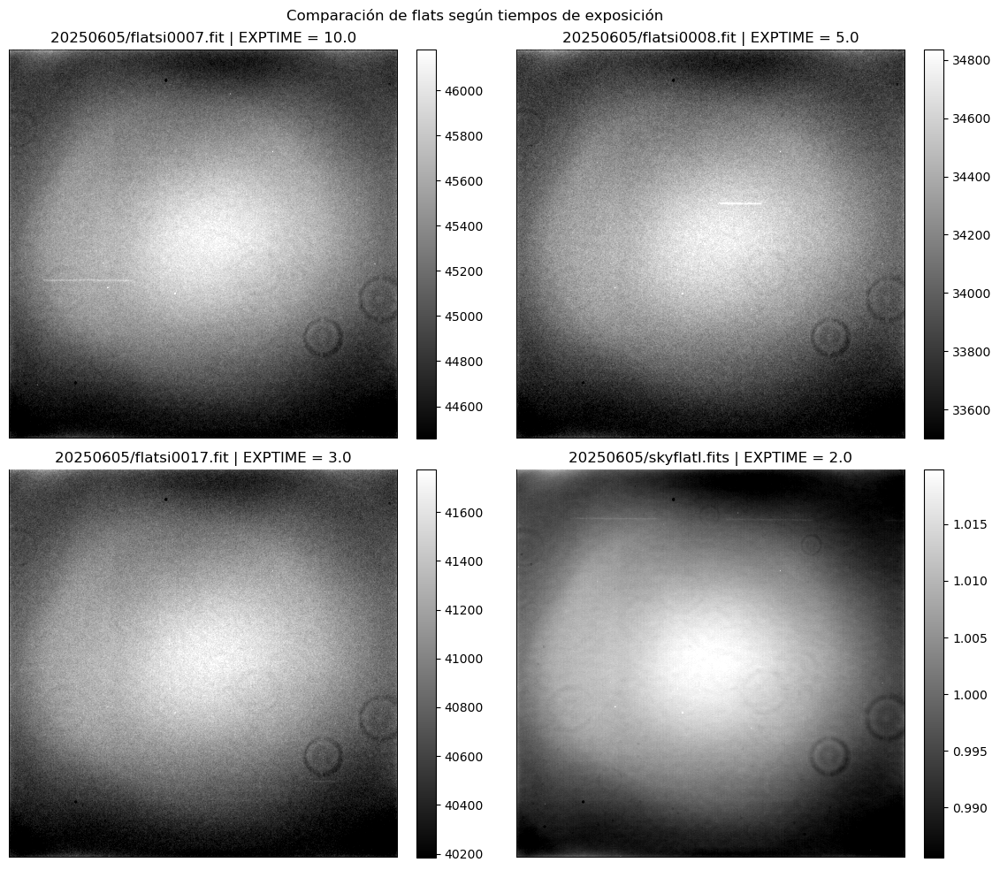

In [9]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np

files = [
    "data/20250605/flatsi0007.fit",
    "data/20250605/flatsi0008.fit", 
    "data/20250605/flatsi0017.fit",
    "data/20250605/skyflatI.fits", 
]

def load_fits(file):
    with fits.open(file) as hdul:
        data = hdul[0].data.astype(float)
        header = hdul[0].header
    return data, header


fig, axes = plt.subplots(2, 2, figsize=(12,10))
axes = axes.flatten()

for ax, file in zip(axes, files):
    data, header = load_fits(file)

    exptime = header.get("EXPTIME", "unknown")

    im = ax.imshow(data, origin="lower", cmap="gray", vmin=np.percentile(data, 5), vmax=np.percentile(data, 99))
    ax.set_title(f"20250605/{file.split('/')[-1]} | EXPTIME = {exptime}")
    ax.axis("off")

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.suptitle("Comparación de flats según tiempos de exposición")
plt.tight_layout()
plt.show()

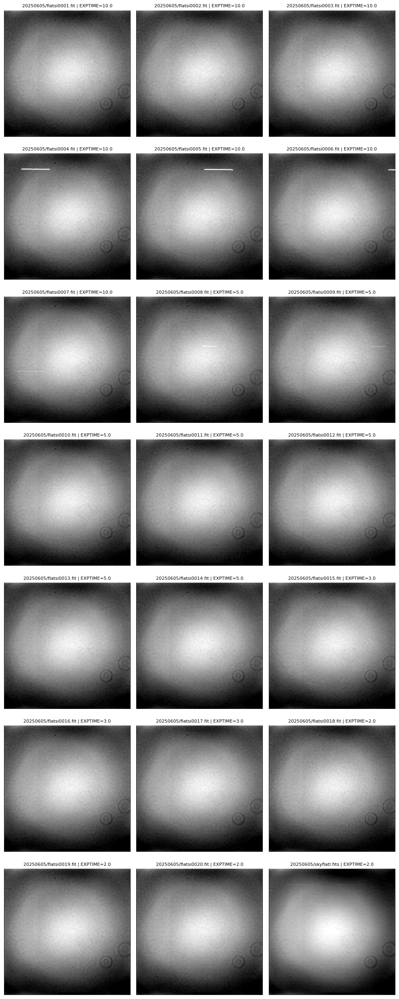

In [47]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np
import os

path = "/home/knowogrodski/Documentos/observation_HSH/ulens_hsh/ulens_hsh/data/20250605"

files = sorted([f for f in os.listdir(path) if f.lower().startswith("flatsi")])+["skyflatI.fits"]

def load_fits(file):
    with fits.open(file) as hdul:
        data = hdul[0].data.astype(float)
        header = hdul[0].header
    return data, header


ncols = 3
nrows = int(np.floor(len(files) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(10, 25))
axes = np.array(axes).flatten()

last_im = None

for ax, file in zip(axes, files):

    full_path = os.path.join(path, file)
    data, header = load_fits(full_path)

    exptime = header.get("EXPTIME", "unknown")

    last_im = ax.imshow(
        data,
        origin="lower",
        cmap="gray",
        vmin=np.percentile(data, 5),
        vmax=np.percentile(data, 99)
    )

    ax.set_title(f"20250605/{file} | EXPTIME={exptime}", fontsize=8)
    ax.axis("off")

# apagar axes vacíos
for ax in axes[len(files):]:
    ax.axis("off")

#fig.colorbar(last_im, ax=axes.tolist(), fraction=0.02, pad=0.01)


plt.tight_layout()
plt.show()

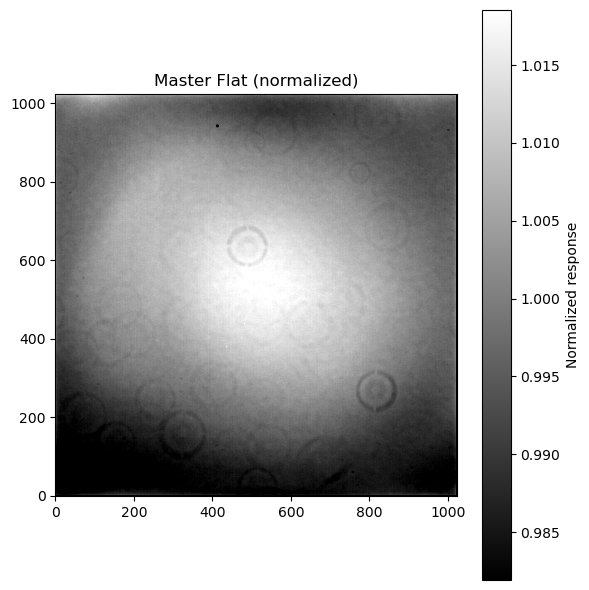

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import os


files = sorted([f for f in os.listdir(path) if "flati0" in f.lower()])
def load_fits(file):
    with fits.open(file, ignore_missing_simple=True) as hdul:
        data = hdul[0].data.astype(float)
    return data


flats = []

for f in files:
    try:
        img = load_fits(os.path.join(path, f))
        if (np.mean(img)>60000) or (np.mean(img)<23000):
            print(f"{f}: bad mean {np.mean(img)}")
            continue

        # limpieza básica
        img = np.nan_to_num(img)

        # normalización
        img = img / np.median(img)


        flats.append(img)

    except Exception as e:
        print(f"Skipping {f}: {e}")

flats = np.array(flats)
master_flat = np.mean(flats, axis=0)
plt.figure(figsize=(6,6))

plt.imshow(
    master_flat,
    origin="lower",
    cmap="gray",
    vmin=np.percentile(master_flat, 5),
    vmax=np.percentile(master_flat, 99)
)

plt.colorbar(label="Normalized response")
plt.title("Master Flat (normalized)")
plt.tight_layout()
plt.show()

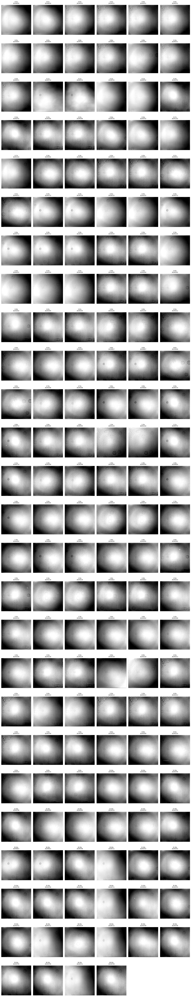

: 

In [ ]:
import os
import glob
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np

# --- CONFIG ---
BASE_PATH = "flats_to_test_exptime"
N_COLS = 6

# --- buscar archivos en subcarpetas ---
files = glob.glob(os.path.join(BASE_PATH, "*", "*.fit*"))

data_list = []

for f in files:
    try:
        with fits.open(f) as hdul:
            data = hdul[0].data
            header = hdul[0].header

            exptime = header.get("EXPTIME", None)

            if data is not None and exptime is not None:
                data_list.append((f, data, exptime))
    except Exception as e:
        print(f"Error con {f}: {e}")

# --- ordenar por exptime ---
data_list.sort(key=lambda x: x[2])

# --- normalización global (clave para comparar flats) ---
all_pixels = np.concatenate([d.flatten() for _, d, _ in data_list])
vmin, vmax = np.percentile(all_pixels, [5, 95])

# --- grid ---
N = len(data_list)
N_ROWS = (N // N_COLS) + 1
import numpy as np

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(15, 3*N_ROWS))
axes = axes.flatten()

for i, (fname, data, exptime) in enumerate(data_list):
    ax = axes[i]

    # --- normalización robusta ---
    data_norm = data / np.median(data)

    # --- escala consistente ---
    vmin, vmax = np.percentile(data_norm, [5, 95])

    ax.imshow(data_norm, origin="lower", cmap="gray", vmin=vmin, vmax=vmax)

    night = os.path.basename(os.path.dirname(fname))
    ax.set_title(f"{exptime:.2f}s\n{night}", fontsize=7)
    ax.axis("off")

for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()